# MCDA for wine quality dataset

## Data analysis

In [191]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

df = pd.read_csv('WineQT.csv', index_col=-1)
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
Id,,,,,,,,,,,,
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [192]:
from ydata_profiling import ProfileReport

ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [193]:
df.duplicated().sum()

125

In [194]:
df.drop_duplicates(keep='first', inplace=True)

In [195]:
df.count()

fixed acidity           1018
volatile acidity        1018
citric acid             1018
residual sugar          1018
chlorides               1018
free sulfur dioxide     1018
total sulfur dioxide    1018
density                 1018
pH                      1018
sulphates               1018
alcohol                 1018
quality                 1018
dtype: int64

The data seems to be balanced enough. The only column that takes correlation values around (-)0.7 is the fixed acidity, so if the models peforms poorly I'll think about removing it.



In [196]:
df['score'] = df['quality'].apply(lambda x: 'good' if x > 5 else 'bad')
df.drop('quality', axis=1, inplace=True)

In [197]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,score
Id,,,,,,,,,,,,
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,bad
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,bad
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,bad
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,good
5,7.4,0.66,0.00,1.8,0.075,13.0,40.0,0.9978,3.51,0.56,9.4,bad


In [198]:
df.to_csv('WineQT_cleaned.csv')

## First model - XGBoost

In [199]:
# XGBoost Model
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from xgboost import XGBClassifier
import xgboost as xgb
from sklearn.preprocessing import LabelEncoder

X = df.drop('score', axis=1)
y = df['score']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

le = LabelEncoder()
y_train = le.fit_transform(y_train)
y_test = le.transform(y_test)

In [200]:
features = X.columns
features_map = dict(zip(features, range(len(features))))
reversed_map = {features_map[x]: x for x in features_map.keys()}

In [201]:
params = {
    "max_depth": len(features_map) * 2,
    "eta": 0.1,
    "nthread": 2,
    "seed": 0,
    "eval_metric": "rmse",
    "monotone_constraints": "(" + ",".join(["1"] * len(features_map)) + ")",
    "n_estimators": 1,
}

In [202]:
model = XGBClassifier(**params)
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

print('Accuracy Score: ', round(accuracy_score(y_test, y_pred), 4))
print('Confusion Matrix: \n', confusion_matrix(y_test, y_pred))
print('Classification Report: \n', classification_report(y_test, y_pred))



Accuracy Score:  0.7108
Confusion Matrix: 
 [[74 24]
 [35 71]]
Classification Report: 
               precision    recall  f1-score   support

           0       0.68      0.76      0.71        98
           1       0.75      0.67      0.71       106

    accuracy                           0.71       204
   macro avg       0.71      0.71      0.71       204
weighted avg       0.71      0.71      0.71       204



In [203]:
booster = model.get_booster()
booster.feature_names = list(features)

In [204]:
from xgboost import plot_tree

<AxesSubplot: >

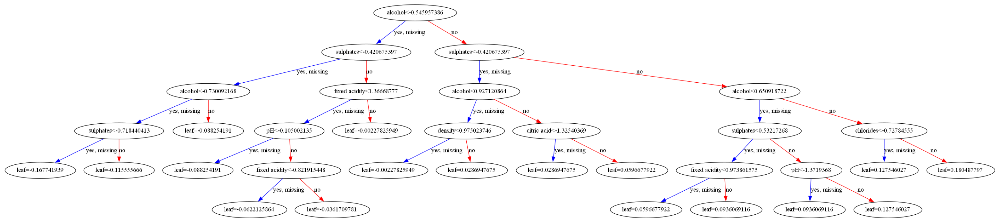

In [205]:
fig, ax = plt.subplots(figsize=(40, 20))
plot_tree(model, ax=ax, num_trees=0)

In [206]:
fscores = booster.get_fscore()
fscores

{'fixed acidity': 3.0,
 'citric acid': 1.0,
 'chlorides': 1.0,
 'density': 1.0,
 'pH': 2.0,
 'sulphates': 4.0,
 'alcohol': 4.0}

In [207]:
score = booster.get_score(importance_type='gain')
score

{'fixed acidity': 3.16068434715271,
 'citric acid': 0.08688068389892578,
 'chlorides': 0.5641326904296875,
 'density': 0.4143916368484497,
 'pH': 3.8327884674072266,
 'sulphates': 15.471819877624512,
 'alcohol': 42.25009536743164}

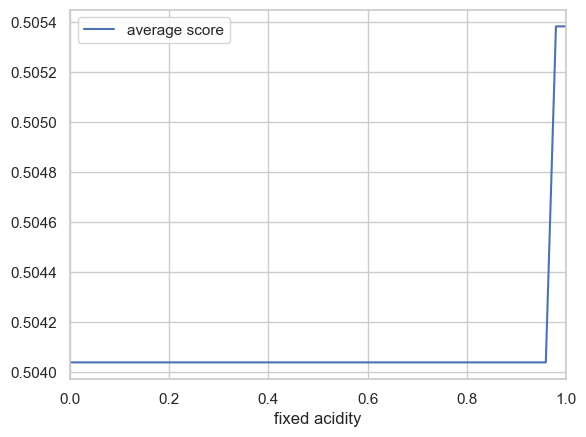

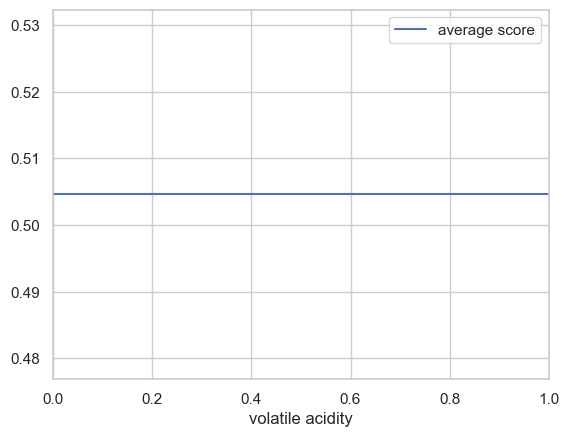

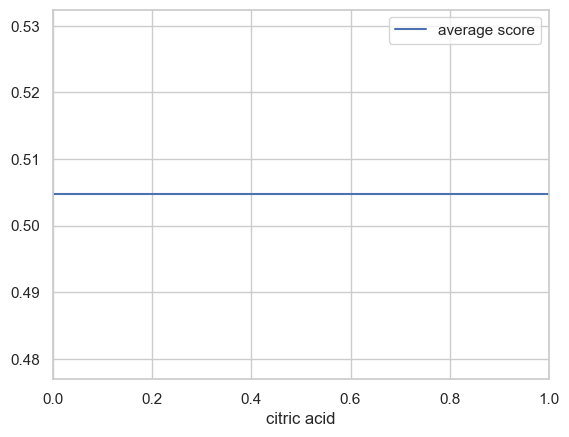

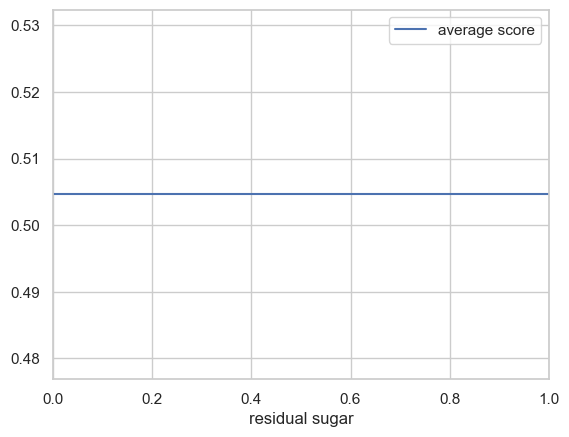

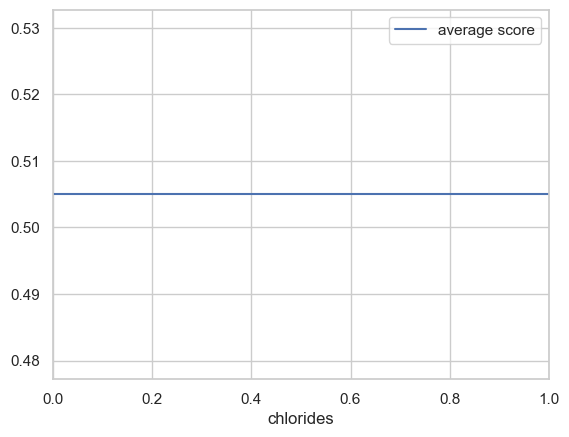

...

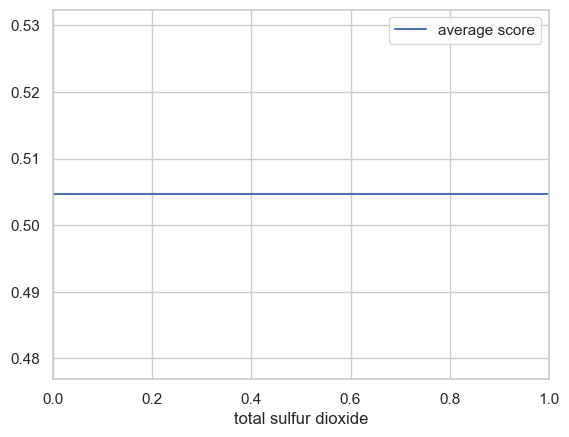

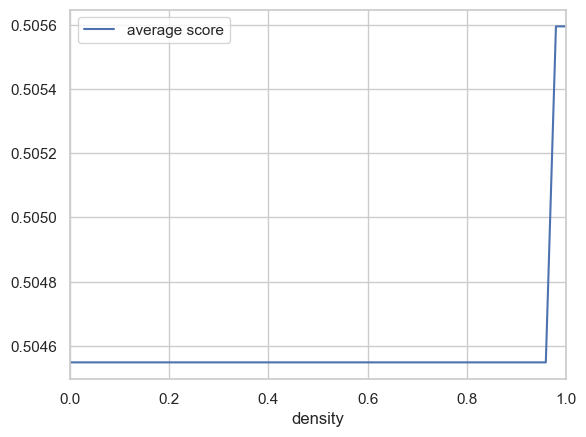

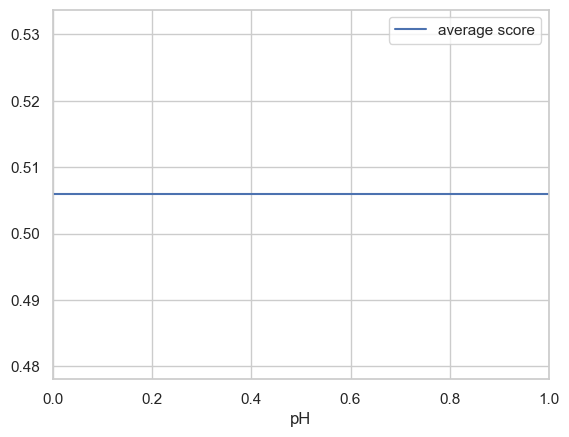

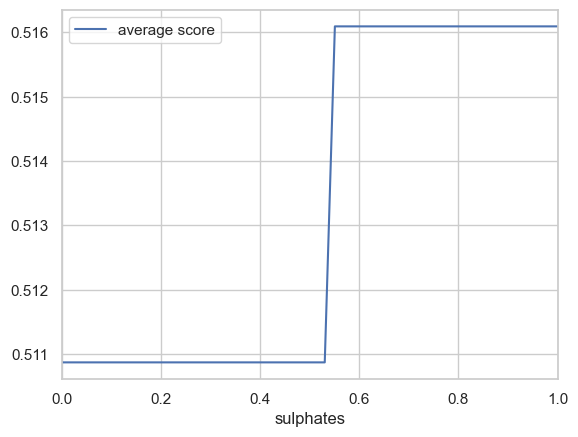

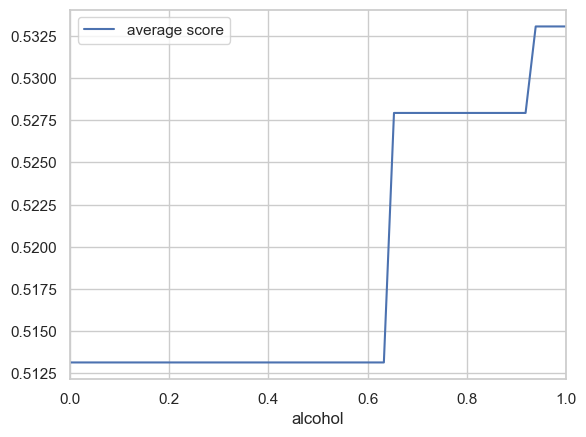

In [208]:
grid = np.linspace(0,1,50)
for c in range(len(features)):
    y_pred = np.zeros(len(grid))
    for i, val in enumerate(grid):
        X_temp = X_train.copy()
        X_temp[:, c] = val
        data = xgb.DMatrix( pd.DataFrame(X_temp), feature_names=features)
        y_pred[i] = np.average(booster.predict(data))
        
    fig, ax = plt.subplots()
    ax.plot(grid, y_pred,  label='average score')
    ax.set_xlim(0, 1)
    ax.set_xlabel(features[c])
    ax.legend()

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


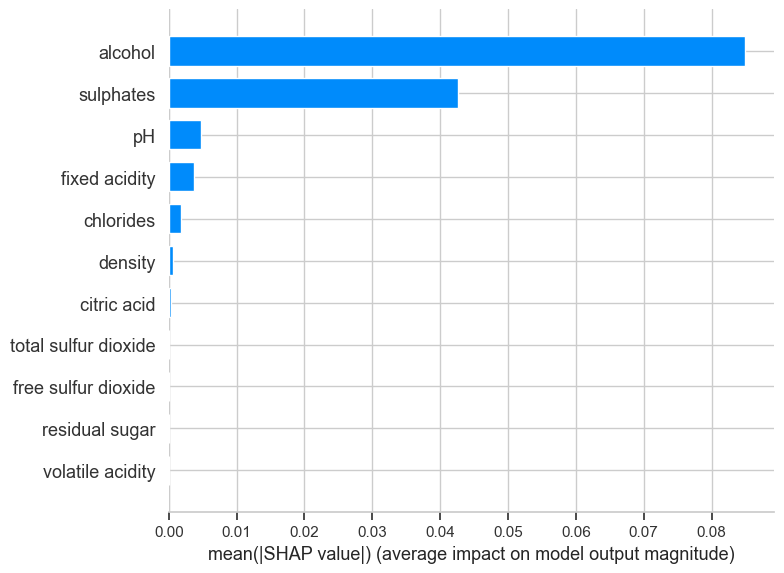

In [209]:
import shap

explainer = shap.TreeExplainer(model)
shape_values = explainer.shap_values(X_test)
shap.summary_plot(shape_values, X_test, plot_type="bar", feature_names=features)

TODO


– Try answer this question in an analytical way based only on the values
of the model parameters and explain why such a change is minimal
(without sampling).


– Perform space sampling by slightly changing the evaluations of alternatives to get a different class. Do the results agree with theoretical
predictions?

## ANN Choquet integral

## Neural network with a few layers with nonlinear activation functions